In [82]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import pywt
import random
from skimage import metrics

In [23]:
def embed_color(YCbCrImage):
  Y = YCbCrImage[:, :, 0]
  Cb = YCbCrImage[:, :, 1]
  Cr = YCbCrImage[:, :, 2]

  LL, (LH, HL, HH) = pywt.dwt2(Y, 'bior1.3')

  Cb2 = cv2.resize(Cb, LH.shape)
  Cr2 = cv2.resize(Cr, HL.shape)

  color_embedded = pywt.idwt2((LL, (Cb2, Cr2, HH)), 'bior1.3')
  color_embedded = np.clip(color_embedded, 0, 255).astype('uint8')
  return color_embedded

In [24]:
def recover_color(color_embedded):
  LL, (Cb2, Cr2, HH) = pywt.dwt2(color_embedded, 'bior1.3')
  Y = pywt.idwt2((LL, (np.zeros_like(Cb2), np.zeros_like(Cr2), HH)), 'bior1.3')

  Cb = cv2.resize(Cb2, color_embedded.shape)
  Cr = cv2.resize(Cr2, color_embedded.shape)

  YCbCrImage = np.stack((Y, Cb, Cr), axis=2)
  YCbCrImage = np.clip(YCbCrImage, 0, 255).astype('uint8')
  return cv2.cvtColor(YCbCrImage, cv2.COLOR_YCR_CB2RGB)

In [25]:
def improve_color(color_recovered, w):
  result = np.array([[
      [0, 0, 0] for _ in range(len(color_recovered[0]))
    ] for _ in range(len(color_recovered))])

  for i, a in enumerate(color_recovered):
    for j, b in enumerate(a):
      x = np.append(b, [1])
      y = np.matmul(x, w)
      
      if np.min(y) < 0:
        y = y + 255 * ((abs(np.min(y)) / 255) + 1)

      y %= 255
      result[i][j] = y

  return result

In [26]:
def fitness_function(RGBImage_arr, color_recovered_arr, w, color_type):
  result = 0

  for i, RGBImage in enumerate(RGBImage_arr):
    RGBImage_color = np.transpose(np.array(RGBImage).transpose(2,0,1).reshape(3,-1))[:, color_type]

    color_recovered_2d = np.array(color_recovered_arr[i])
    color_recovered_2d = color_recovered_2d.transpose(2,0,1).reshape(3,-1)

    arr_one = np.array([1 for _ in range(len(color_recovered_2d[0]))])
    color_recovered_2d = np.vstack([color_recovered_2d, arr_one])
    color_recovered_2d = np.transpose(color_recovered_2d)

    result_arr = np.matmul(color_recovered_2d, w)

    if np.min(result_arr) < 0:
      result_arr = result_arr + 255 * ((abs(np.min(result_arr)) / 255) + 1)

    result_arr %= 255
    result_arr = abs(RGBImage_color - result_arr)
    result += np.sum(result_arr)

  return result

In [27]:
def weight(w_max, w_min, n_iteration, iteration):
  return (w_max - w_min) * ((n_iteration - iteration) / n_iteration) + w_min

In [28]:
def LDWPSO(RGBImage_arr, color_recovered_arr):
  c1 = 0.5
  c2 = 0.9
  n_iteration = 1000
  n_particles = 10
  w_max = 0.9
  w_min = 0.4

  particles_wr = np.array([[
      random.random(),
      random.random(),
      random.random(),
      random.random(),
    ] for _ in range(n_particles)])

  particles_wg = np.array([[
      random.random(),
      random.random(),
      random.random(),
      random.random(),
    ] for _ in range(n_particles)])

  particles_wb = np.array([[
      random.random(),
      random.random(),
      random.random(),
      random.random(),
    ] for _ in range(n_particles)])

  pbest_position_wr = particles_wr
  pbest_position_wg = particles_wg
  pbest_position_wb = particles_wb

  pbest_fitness_value_wr = np.array([float('inf') for _ in range(n_particles)])
  pbest_fitness_value_wg = np.array([float('inf') for _ in range(n_particles)])
  pbest_fitness_value_wb = np.array([float('inf') for _ in range(n_particles)])

  gbest_position_wr = np.array([float('inf'), float('inf'), float('inf'), float('inf')])
  gbest_position_wg = np.array([float('inf'), float('inf'), float('inf'), float('inf')])
  gbest_position_wb = np.array([float('inf'), float('inf'), float('inf'), float('inf')])

  gbest_fitness_value_wr = float('inf')
  gbest_fitness_value_wg = float('inf')
  gbest_fitness_value_wb = float('inf')

  velocity_wr = np.array([[0, 0, 0, 0] for _ in range(n_particles)])
  velocity_wg = np.array([[0, 0, 0, 0] for _ in range(n_particles)])
  velocity_wb = np.array([[0, 0, 0, 0] for _ in range(n_particles)])

  i = 0
  while i < n_iteration:
    for j in range(n_particles):
      fitness_wr = fitness_function(RGBImage_arr, color_recovered_arr, particles_wr[j], 0)
      fitness_wg = fitness_function(RGBImage_arr, color_recovered_arr, particles_wg[j], 1)
      fitness_wb = fitness_function(RGBImage_arr, color_recovered_arr, particles_wb[j], 2)

      if pbest_fitness_value_wr[j] > fitness_wr:
        pbest_fitness_value_wr[j] = fitness_wr
        pbest_position_wr[j] = particles_wr[j]

      if pbest_fitness_value_wg[j] > fitness_wg:
        pbest_fitness_value_wg[j] = fitness_wg
        pbest_position_wg[j] = particles_wg[j]

      if pbest_fitness_value_wb[j] > fitness_wb:
        pbest_fitness_value_wb[j] = fitness_wb
        pbest_position_wb[j] = particles_wb[j]

      if gbest_fitness_value_wr > fitness_wr:
        gbest_fitness_value_wr = fitness_wr
        gbest_position_wr = particles_wr[j]

      if gbest_fitness_value_wg > fitness_wg:
        gbest_fitness_value_wg = fitness_wg
        gbest_position_wg = particles_wg[j]

      if gbest_fitness_value_wb > fitness_wb:
        gbest_fitness_value_wb = fitness_wb
        gbest_position_wb = particles_wb[j]
    
    for j in range(n_particles):
      w = weight(w_max, w_min, n_iteration, i+1)

      velocity_wr[j] = (w*velocity_wr[j]) 
      + (c1*random.random()) * (pbest_position_wr[j] - particles_wr[j]) 
      + (c2*random.random()) * (gbest_position_wr-particles_wr[j])

      particles_wr[j] += velocity_wr[j]

      velocity_wg[j] = (w*velocity_wg[j]) 
      + (c1*random.random()) * (pbest_position_wg[j] - particles_wg[j]) 
      + (c2*random.random()) * (gbest_position_wg-particles_wg[j])

      particles_wg[j] += velocity_wg[j]

      velocity_wb[j] = (w*velocity_wb[j]) 
      + (c1*random.random()) * (pbest_position_wb[j] - particles_wb[j]) 
      + (c2*random.random()) * (gbest_position_wb-particles_wb[j])
      
      particles_wb[j] += velocity_wb[j]

    i += 1

  result = np.vstack((gbest_position_wr, gbest_position_wg, gbest_position_wb))
  result = np.transpose(result)
  
  return result

In [45]:
titles = ['Original', 'Color Embedded', 'Recovered', 'Improved']

training = ['/training/4.1.01.tiff', '/training/4.1.02.tiff',
            '/training/4.1.03.tiff', '/training/4.1.04.tiff',
            '/training/4.1.05.tiff', '/training/4.1.06.tiff', 
            '/training/4.1.07.tiff', '/training/4.1.08.tiff']

testing = ['/testing/kodim01.png', '/testing/kodim02.png',
           '/testing/kodim03.png', '/testing/kodim04.png',
           '/testing/kodim05.png', '/testing/kodim06.png', 
           '/testing/kodim07.png', '/testing/kodim08.png',
           '/testing/kodim09.png', '/testing/kodim10.png',
           '/testing/kodim11.png', '/testing/kodim12.png',
           '/testing/kodim13.png', '/testing/kodim14.png',
           '/testing/kodim15.png', '/testing/kodim16.png',
           '/testing/kodim17.png', '/testing/kodim18.png',
           '/testing/kodim19.png', '/testing/kodim20.png',
           '/testing/kodim21.png', '/testing/kodim22.png',
           '/testing/kodim23.png', '/testing/kodim24.png',
           '/testing/kodim25.png']

In [30]:
RGBImage_arr = []
color_embedded_arr = []
color_recovered_arr = []

In [31]:
for v in training:
  BGRImage = cv2.imread(v, 1)
  RGBImage = cv2.cvtColor(BGRImage, cv2.COLOR_BGR2RGB)
  YCbCrImage = cv2.cvtColor(RGBImage, cv2.COLOR_RGB2YCR_CB)

  color_embedded = embed_color(YCbCrImage)
  color_recovered = recover_color(color_embedded)
  
  RGBImage_arr.append(RGBImage)
  color_embedded_arr.append(color_embedded)
  color_recovered_arr.append(color_recovered)

In [32]:
w = LDWPSO(RGBImage_arr, color_recovered_arr)
w

array([[0.67024185, 0.10639362, 0.22064873],
       [0.22046649, 0.62534546, 0.32645332],
       [0.55546575, 0.27687459, 0.75816274],
       [0.13012353, 0.70212451, 0.24357023]])

In [54]:
RGBImage_testing = []
color_embedded_testing = []
color_recovered_testing = []
color_improved_testing = []

In [55]:
for v in testing:
  BGRImage = cv2.imread(v, 1)
  BGRImage = cv2.resize(BGRImage, (512, 512))
  RGBImage = cv2.cvtColor(BGRImage, cv2.COLOR_BGR2RGB)
  YCbCrImage = cv2.cvtColor(RGBImage, cv2.COLOR_RGB2YCR_CB)

  color_embedded = embed_color(YCbCrImage)
  color_recovered = recover_color(color_embedded)
  color_improved = improve_color(color_recovered, w)
  
  RGBImage_testing.append(RGBImage)
  color_embedded_testing.append(color_embedded)
  color_recovered_testing.append(color_recovered)
  color_improved_testing.append(color_improved)

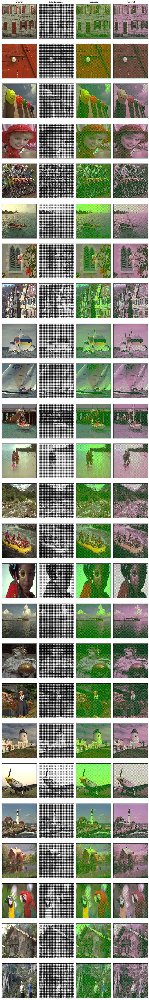

In [100]:
fig = plt.figure(figsize=(12, 80))

for i in range(len(testing)):
  images = [RGBImage_testing[i], color_embedded_testing[i], 
            color_recovered_testing[i], color_improved_testing[i]]

  for j, a in enumerate(images):
    ax = fig.add_subplot(len(testing), 4, j + 1 + 4 * i)
    ax.imshow(a, interpolation="nearest", cmap=plt.cm.gray)

    if i == 0:
      ax.set_title(titles[j], fontsize=10)

    ax.set_xticks([])
    ax.set_yticks([])

fig.tight_layout()
plt.show()

In [103]:
RGBImage = np.vstack(RGBImage_testing)
color_improved = np.vstack(color_improved_testing)

PSNR = metrics.peak_signal_noise_ratio(RGBImage, color_improved, data_range=None)
SSIM = metrics.structural_similarity(RGBImage, color_improved, multichannel=True)

print('PSNR = ' + str(PSNR))
print('SSIM = ' + str(SSIM))

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: UserWarning: Inputs have mismatched dtype.  Setting data_range based on im_true.
  after removing the cwd from sys.path.
/usr/local/lib/python3.7/dist-packages/skimage/metrics/_structural_similarity.py:108: UserWarning: Inputs have mismatched dtype.  Setting data_range based on im1.dtype.
  im2[..., ch], **args)


PSNR = 17.83485913996905
SSIM = 0.5030875484096474
